In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import medfilt
import csv
from pathlib import Path
import os
from multiprocessing import Pool

In [2]:
def get_frames(video_path):
  cap = cv2.VideoCapture(video_path)
  frames = []
  while cap.isOpened():
    ref, frame = cap.read()
    if not ref:
      break
    frames.append(frame)
  return frames

In [3]:
def create_pairs(frames):
  frames_pairs = list(zip(frames[:-1], frames[1:]))
  return frames_pairs

In [4]:
def hist_diff(pairs):
  frame1, frame2 = pairs
  h1 = cv2.calcHist([frame1], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
  h2 = cv2.calcHist([frame2], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])

  return cv2.compareHist(h1, h2, cv2.HISTCMP_BHATTACHARYYA)

In [5]:
def hist_diff_2(pairs, resize=(64, 64)):
    frame1, frame2 = pairs
    frame1 = cv2.resize(frame1, resize)
    frame2 = cv2.resize(frame2, resize)

    hsv1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2HSV)
    hsv2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2HSV)

    h1 = cv2.calcHist([hsv1], [0,1,2], None, [8,8,8], [0,256,0,256,0,256])
    h2 = cv2.calcHist([hsv2], [0,1,2], None, [8,8,8], [0,256,0,256,0,256])

    h1 = cv2.normalize(h1, h1).flatten()
    h2 = cv2.normalize(h2, h2).flatten()

    return cv2.compareHist(h1, h2, cv2.HISTCMP_BHATTACHARYYA)

In [6]:
def proccessing_all_pairs(def_name,frame_pairs, num_workers):
  with Pool(processes=num_workers) as pool:
    results = pool.map(def_name, frame_pairs)
  return results

In [8]:
def detect_scene(video_path, threshold=2.0, window_size=50):
  num_workers = os.cpu_count()
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  frames_count = cap.get(cv2.CAP_PROP_FRAME_COUNT)
  prev_frame = None
  frame_pairs = create_pairs(get_frames(video_path))
  diffs = [hist_diff(pairs) for pairs in frame_pairs]
  diffs = np.array(diffs)

  thresholds = []
  for i in range(len(diffs)):
      start = max(0, i - window_size // 2)
      end = min(len(diffs), i + window_size // 2)
      if start >= end:
          thresholds.append(np.inf)
      else:
          local_mean = np.mean(diffs[start:end])
          local_std = np.std(diffs[start:end])
          thresholds.append(local_mean + threshold * local_std)

  scene_change = []
  for i, d in enumerate(diffs):
    if d > thresholds[i]:
      scene_change.append(i + 1)
  return scene_change, fps, frames_count

In [9]:
def frame_second(frame_num, fps):
  seconds = frame_num / fps
  return seconds

In [10]:
def show_frame_at(video_path, frame_num):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    ret, frame = cap.read()
    if ret:
        # Конвертируем BGR → RGB (потому что OpenCV использует BGR, а matplotlib — RGB)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8, 6))
        plt.imshow(frame_rgb)
        plt.title(f"Кадр {frame_num}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Кадр {frame_num} не найден")
    cap.release()

In [13]:
scene_changes, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/shary.mp4', 2.0)
print(f'Смены сцен по кадрам: {scene_changes}, кол-во кадров в видео: {frame_counts}')

Смены сцен по кадрам: [35, 69, 109, 150, 181, 209, 245, 275, 310, 349, 351, 430, 463, 518, 585, 635, 652, 656, 683, 699, 745, 775, 792, 793, 820, 836, 864, 895, 949, 979, 1035, 1063, 1089, 1143, 1169, 1192, 1236, 1256, 1298, 1339, 1349, 1350, 1404, 1437, 1486, 1525, 1527, 1556, 1610, 1641, 1675, 1705, 1740, 1773, 1807, 1816, 1817, 1868, 1913, 1916, 1967, 2008], кол-во кадров в видео: 2036.0


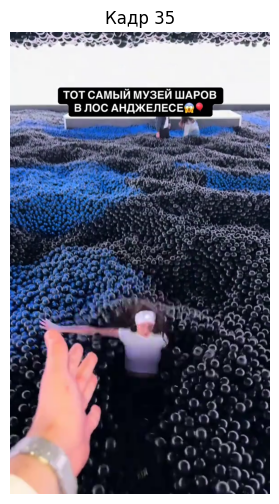

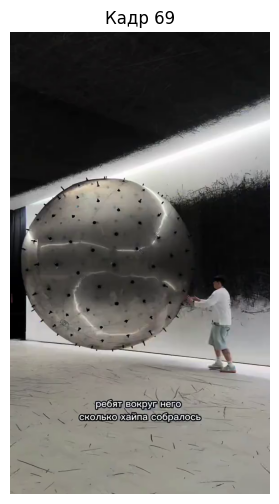

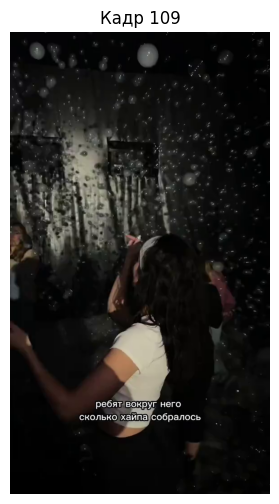

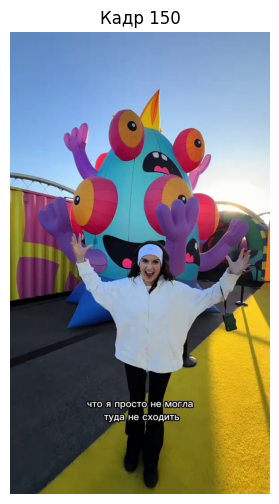

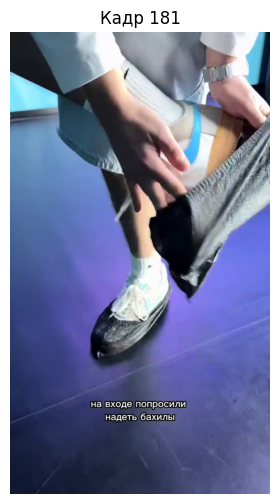

...

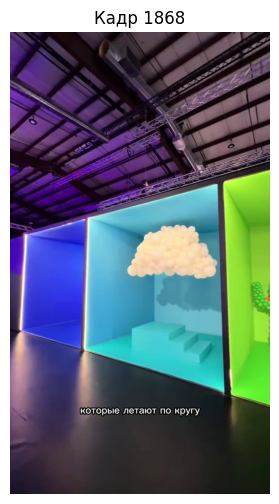

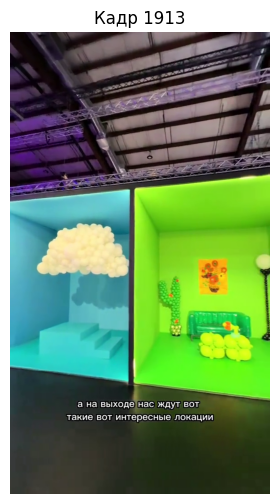

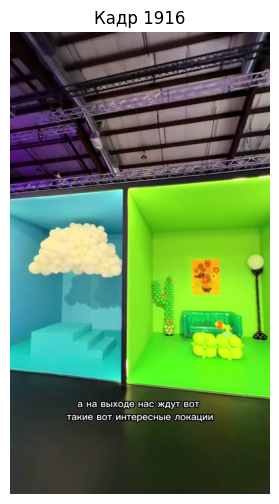

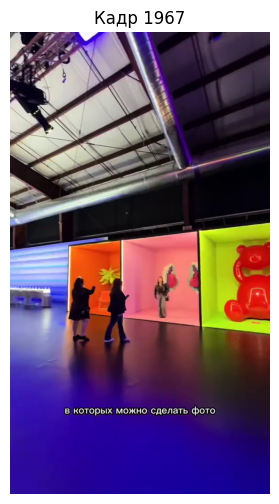

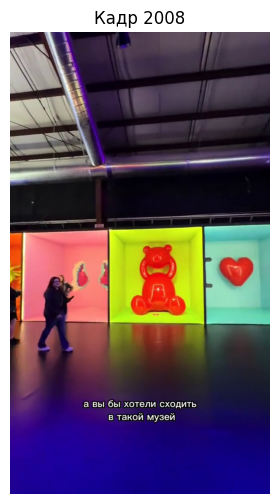

In [14]:
for frame in scene_changes:
  show_frame_at('/content/drive/MyDrive/practical_data/shary.mp4', frame)

In [ ]:
for i in [64, 128, 256]:
  for k in [50, 100, 150]:
    scene_changes, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/man_in_costume.mp4', 2.0, window_size=100)
    output_path = Path('/content/drive/MyDrive/Colab Notebooks/classical_SCD')
    output_file = output_path / f'pain_size{i}_wind{k}.csv'
    with open(output_file, 'w', newline='') as f:
      writer = csv.writer(f)
      writer.writerow(['predicted_scenes'])
      for j in scene_changes:
        writer.writerow([j])

Метод гистограммной разницы основан на сравнении цветовых распределений двух соседних кадров. Идея заключается в том, что при резкой смене сцены (hard cut) цветовой состав кадров кардинально меняется, что отражается в значительной разнице их гистограмм.

In [ ]:
scene_changes, diffs, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/man_presentation.mp4', 2.0)
print(f'Смены сцен по кадрам: {scene_changes}, Кадров в видео: {frame_counts}')

In [ ]:
for frame in scene_changes:
  sec = frame_second(frame, fps)
  print(f'Кадр под номером {frame} был на {sec:.2f}секунде')

FPS -> 25.0
Кадр под номером 141 был на 5.64секунде
Кадр под номером 194 был на 7.76секунде
Кадр под номером 265 был на 10.60секунде
Кадр под номером 333 был на 13.32секунде
Кадр под номером 395 был на 15.80секунде
Кадр под номером 444 был на 17.76секунде
Кадр под номером 512 был на 20.48секунде
Кадр под номером 576 был на 23.04секунде
Кадр под номером 660 был на 26.40секунде
Кадр под номером 792 был на 31.68секунде
Кадр под номером 875 был на 35.00секунде
Кадр под номером 956 был на 38.24секунде
Кадр под номером 1001 был на 40.04секунде
Кадр под номером 1053 был на 42.12секунде
Кадр под номером 1110 был на 44.40секунде
Кадр под номером 1175 был на 47.00секунде
Кадр под номером 1540 был на 61.60секунде
Кадр под номером 1622 был на 64.88секунде
Кадр под номером 1684 был на 67.36секунде
Кадр под номером 1714 был на 68.56секунде
Кадр под номером 1741 был на 69.64секунде
Кадр под номером 1805 был на 72.20секунде
Кадр под номером 1885 был на 75.40секунде
Кадр под номером 2092 был на 83.68се

In [ ]:
scene_changes, diffs, fps, frame_count = detect_scene('/content/drive/MyDrive/practical_data/small_people.mp4', 2.0)
print(f'Смены сцен по кадрам: {scene_changes}, кадров в ролике {frame_count}')

ValueError: not enough values to unpack (expected 4, got 3)

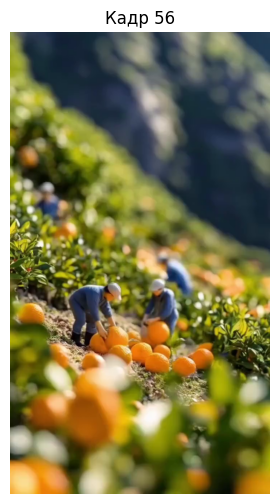

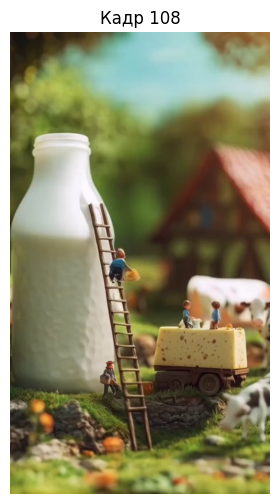

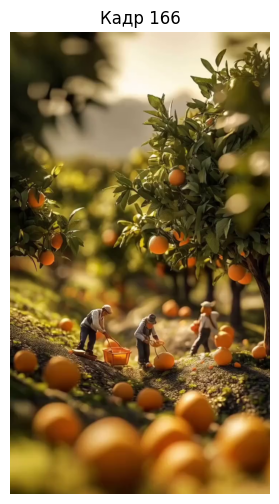

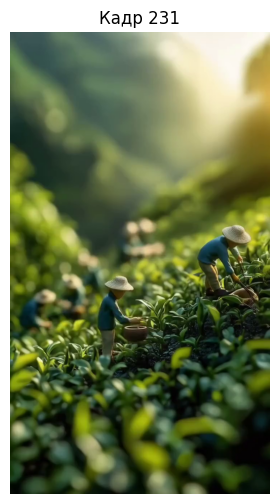

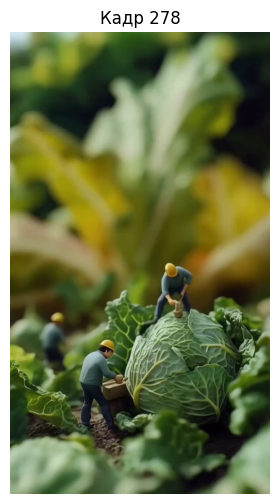

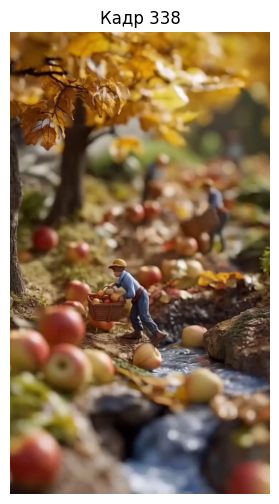

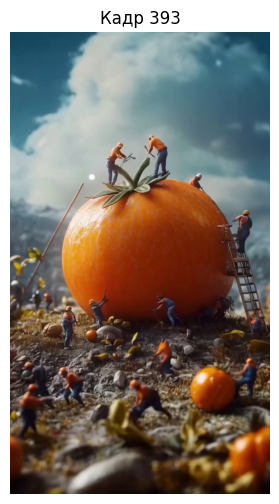

In [ ]:
for frame in scene_changes:
 show_frame_at('/content/drive/MyDrive/practical_data/small_people.mp4', frame)

In [ ]:
scene_changes, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/zodiaks.mp4', 2.0)
print(f'Смены сцен по кадрам: {scene_changes}, кадров в видео: {frame_counts}')

Смены сцен по кадрам: [29, 96, 180, 191, 236, 300, 335, 336, 377, 400, 430, 482, 483, 485, 487, 539, 584, 600, 666, 706, 720, 771, 867, 900, 928, 958, 1024, 1052, 1053, 1101, 1177, 1178, 1250, 1280, 1328, 1359, 1361, 1399, 1411, 1462, 1463, 1504, 1522, 1565, 1591, 1621, 1655, 1656, 1664, 1719, 1722, 1772, 1808, 1860, 1861, 1877, 1885, 1892, 1945, 1993, 1999], кадров в видео: 2013.0


In [ ]:
len(scene_changes)

61

In [ ]:
 for frame in scene_changes:
  show_frame_at('/content/drive/MyDrive/practical_data/zodiaks.mp4', frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
scene_changes, diffs, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/olens.mp4', 2.0)
print(f'Смены сцен по кадрам: {scene_changes}, кадров в видео: {frame_counts}')

Смены сцен по кадрам: [216, 305, 627, 744, 768, 804, 886, 1216, 1309, 1681, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967], кадров в видео: 1971.0


In [ ]:
for frame in scene_changes:
  show_frame_at('/content/drive/MyDrive/practical_data/olens.mp4', frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
scene_changes, diffs, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/intro.mp4', 2.0)
print(f'Смена сцены на кадре {scene_changes}, кадров в видео {frame_counts}')

Смена сцены на кадре [158, 159, 160, 161, 262, 361, 462, 561, 608, 660, 761, 812, 860, 909, 964, 1009], кадров в видео 1267.0


In [ ]:
for frame in scene_changes:
  show_frame_at('/content/drive/MyDrive/practical_data/intro.mp4', frame)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
scene_changes, diffs, fps, frame_counts = detect_scene('/content/drive/MyDrive/practical_data/inteview.mp4', 2.0)
print(f'Сцена меняется на кадре {scene_changes}, кадров в видео {frame_counts}')

Сцена меняется на кадре [2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 30, 31, 32, 33, 34, 35, 37, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 76, 150, 339, 448, 518, 659, 1148, 1187, 1312, 2105, 2140, 2355, 3324, 3646, 3678, 3895, 4290, 4655, 6103, 6462, 6500, 7511, 8602, 8835, 8865, 10145, 10522, 11449, 11450, 11732, 11763, 14209, 14241, 14642, 14809, 15311, 15312, 15313, 16745, 16783, 19831, 20023, 20024, 20072], кадров в видео 20073.0


In [ ]:
for frame in scene_changes:
  show_frame_at('/content/drive/MyDrive/practical_data/inteview.mp4', frame)

Output hidden; open in https://colab.research.google.com to view.